# Megerősítéses tanulás

In [24]:
!pip install gym
!pip install torch
!pip install pygame
!pip install gym[toytext]

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


## Könyvtárak

In [25]:
import gym
import random
import numpy as np
import seaborn as sns
import matplotlib as mpl
from tensorflow import keras
from collections import deque
import matplotlib.pyplot as plt
from matplotlib import animation
from collections import namedtuple
from scipy.signal import fftconvolve

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Configs
import warnings
warnings.filterwarnings('ignore')
keras.backend.clear_session()
mpl.rc('animation', html='jshtml')

## Animációs függvények

In [26]:
def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,


def plot_animation(frames, repeat=True, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

## Segédfüggvények

In [27]:
# Mozgóátlagolás (gyors Fourier-transzformáció konvolúcióval)
def window_avg(lst, window_size):
    window_size = int(window_size)
    kernel = np.ones(window_size) / window_size
    return fftconvolve(lst, kernel, mode='valid')


# Teljes átlagolás
def rolling_avg(lst):
    lst_sum = np.cumsum(lst)  # Kumulatív összeg
    lst_avg = lst_sum / (np.arange(len(lst)) + 1)  # Kumulatív összeg és a darabszámok hányadosa
    return list(lst_avg)


# Segédfüggvény jutalmak ábrázolására
def plot_rewards(rewards, title=False, window_size=False, rolling=False):
    if window_size > 1:  # Ha adott az ablakméret akkor számítson ablakolt átlagot
        rewards = window_avg(rewards, window_size)
    if rolling:  # Ha gördülő átlagolás be van kapcsolva számítson gördülő átlagot
        rewards = rolling_avg(rewards)
    # Create and show plot
    plt.figure(figsize=(5, 3))
    plt.plot(rewards)
    if title:
        plt.title(title)
    plt.xlabel('Időlépés')
    plt.ylabel('Jutalom')
    plt.show()


# Cselekvések leképezése UTF-8 karakterekre
actions = {
    0: "←",
    1: "↓",
    2: "→",
    3: "↑"
}


# Függvény a leképezésekre
def action_mapping(action):
    return actions[action]


# Cselekvési tér
A = list(actions.keys())  

## Egyszerű mozgatása az ügynöknek

Környezet állapota: 0 

Cselekvési tér: Discrete(4) 

Környezet állapota: 0 

Jutalom 1 lépésért: 0.0 

Epizód vége:  False 

Info:  False 

állapot: 0,	 cselekvés: ←,	 következő állapot: 0,	 jutalom: 0.0
állapot: 0,	 cselekvés: ←,	 következő állapot: 4,	 jutalom: 0.0
állapot: 4,	 cselekvés: ←,	 következő állapot: 4,	 jutalom: 0.0
állapot: 4,	 cselekvés: ←,	 következő állapot: 8,	 jutalom: 0.0
állapot: 8,	 cselekvés: ←,	 következő állapot: 4,	 jutalom: 0.0
állapot: 4,	 cselekvés: ←,	 következő állapot: 8,	 jutalom: 0.0
állapot: 8,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0.0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←

állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő á

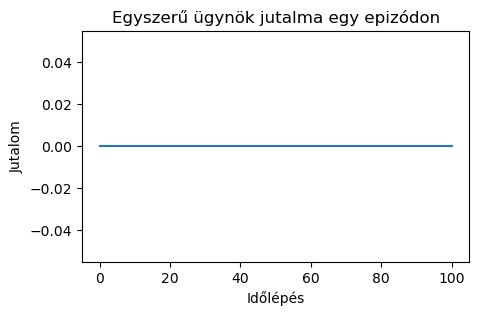

In [28]:
# Egyszerű mozgatása az ágensnek 
env = gym.make('FrozenLake-v1', render_mode="rgb_array")
state = env.reset()[0]
print('Környezet állapota:', state, '\n')  # Környezeti változók
print('Cselekvési tér:', env.action_space, '\n')  # Lehetséges lépések könyvtára

state, reward, done, info, _ = env.step(0)  # Egy lépés lefele

print('Környezet állapota:', state, '\n')  # Változók újra
print('Jutalom 1 lépésért:', reward, '\n')  # Jutalom 
print('Epizód vége: ', done, '\n')  # Vége az epizódnak?
print('Info: ', info, '\n')  # Extra adatok debugging-hoz


# Egyszerű ügynök definiálása
def left_agent(obs):  
    return 0


frames = []  # Képkockáknak követési struktúra
rewards = [reward]  # Jutalom követési struktúra
for i in range(100):
    action = left_agent(state)
    next_state, reward, done, info, _ = env.step(action)  # Cselekvés végrehajtása 
    rewards.append(reward)  # Jutalom hozzáfűzése a követési struktúrához
    img = env.render()  # Környezet renderelése egy RGB mátrixba
    frames.append(img)  # RGB mátrix hozzáfűzése a videóhoz
    print(f"állapot: {state},\t cselekvés: {action_mapping(action)},\t következő állapot: {next_state},\t jutalom: {reward}")
    state = next_state

env.close()  # Környezet elengedése
plot_rewards(rewards, title='Egyszerű ügynök jutalma egy epizódon')  # Jutalmak ábrázolása
plot_animation(frames)  # Videó lejátszása

## Véletlen mozgatása az ügynöknek

állapot: 0,	 cselekvés: ←,	 következő állapot: 0,	 jutalom: 0.0
állapot: 0,	 cselekvés: ←,	 következő állapot: 4,	 jutalom: 0.0
állapot: 4,	 cselekvés: ↓,	 következő állapot: 8,	 jutalom: 0.0
állapot: 8,	 cselekvés: ↓,	 következő állapot: 8,	 jutalom: 0.0
állapot: 8,	 cselekvés: ↓,	 következő állapot: 12,	 jutalom: 0.0
állapot: 12,	 cselekvés: ↑,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ↓,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: →,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: →,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ←,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ↑,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ↓,	 következő állapot: 12,	 jutalom: 0
állapot: 12,	 cselekvés: ↑,	 következő 

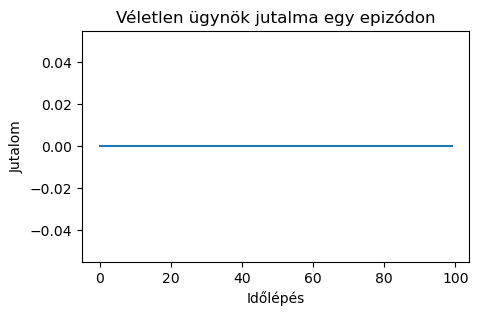

In [29]:
def random_agent(obs):  # Ügynök definiálása
    return np.random.choice(A)


env = gym.make('FrozenLake-v1', render_mode="rgb_array")
state = env.reset()[0]

frames = []
rewards = []
for i in range(100):
    action = random_agent(state)
    next_state, reward, done, info, _ = env.step(action)  # Cselekvés végrehajtása 
    rewards.append(reward)
    img = env.render()  # Környezet renderelése egy RGB mátrixba
    frames.append(img)  # RGB mátrix hozzáfűzése a videóhoz
    print(f"állapot: {state},\t cselekvés: {action_mapping(action)},\t következő állapot: {next_state},\t jutalom: {reward}")
    state = next_state


env.close()  # Környezet elengedése
plot_rewards(rewards, title='Véletlen ügynök jutalma egy epizódon')  # Jutalmak ábrázolása
plot_animation(frames)  # Videó lejátszása

## $Q$-tanulás
### $\varepsilon$-mohó $Q$-ügynök

In [30]:
def QLAgent(Q, eps, s):
    p = np.random.random()  # Véletlen szám sorsolása
    if p < eps or max(Q[s]) == 0:  # Véletlen cselekvés végrehajtása
        return np.random.choice(A)
    else:  # Legjobb ismert cselekvés végrehajtása
        return np.argmax(Q[s])  # Legjobb cselekvés indexálása a Q-táblából

### Paraméterek

In [31]:
max_i = 100000  # Iterációk száma
gamma = 0.95  # Diszkontálási tényező
alpha = 0.2  # Tanulási sebesség
eps_start = 0.99  # Felfedezési valószínűség kezdőértéke
eps_end = 0.0  # Felfedezési valószínűség végső értéke
eps_decay = 0.99995  # Felfedezési valószínűség csökkentési értéke
eps = eps_start  # Felfedezési valószínűség inicializálása
rewards = []  # Jutalmak követésére adatstruktúra
rewards_mean = []  # Jutalmak átlagolására struktúra

### Tanítás futtatása 

In [32]:
Q = [[0 for _ in range(env.action_space.n)] for _ in range(env.observation_space.n)] # Q-tábla inicializálása
Q[env.observation_space.n - 1][:] = [0 for _ in range(env.action_space.n)] # Terminális állapot cselekvés-értékének kinullázása

for i in range(max_i):  # Iteráció minden epizódra
    state = env.reset()[0]  # Állapot inicializálása
    done = False  # Megállt az epizód? 
    r_sum = 0  # Jutalom összegző változója

    while not done:
        action = QLAgent(Q, eps, state)  # Cselekvés választása a Q-mohó ügynökkel
        next_state, reward, done, info, _ = env.step(action)  # Cselekvés végrehajtása a környezetben
        Q[state][action] = Q[state][action] + alpha * (reward + gamma * max(Q[next_state]) - Q[state][action])  # Új Q-érték kiszámítása
        r_sum += reward  # Jutalom hozzáadása az epizodikus jutalomhoz
        state = next_state  # Állapot frissítése
    
    eps = eps * eps_decay if eps > eps_end else eps_end  # Epszilon párologtatása
    rewards.append(r_sum)  # Jutalom hozzáfűzése a követési struktúrához
    rewards_mean.append(np.mean(rewards))

### Jutalmak ábrázolása

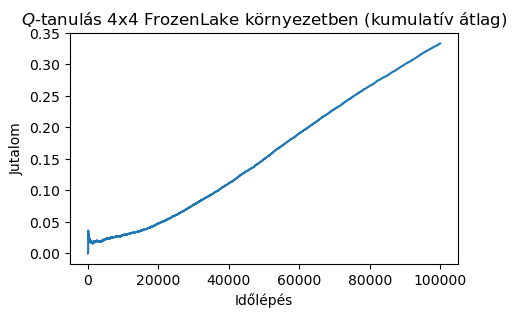

In [33]:
plot_rewards(rewards, rolling=True, title=r'$Q$-tanulás 4x4 FrozenLake környezetben (kumulatív átlag)')

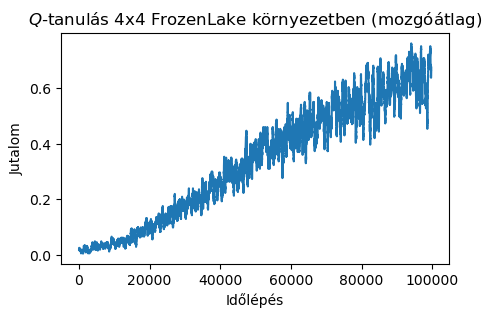

In [34]:
window_size = 300
plot_rewards(rewards, window_size=window_size, title=r'$Q$-tanulás 4x4 FrozenLake környezetben (mozgóátlag)')

### $Q$-tábla ábrázolása

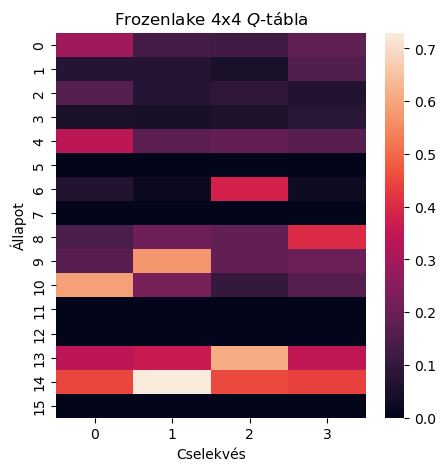

In [35]:
plt.figure(figsize=(5, 5))
sns.heatmap(Q)
plt.ylabel('Állapot')
plt.xlabel('Cselekvés')
plt.title(r'Frozenlake 4x4 $Q$-tábla')
plt.show()

### Epizód lejátszása az ügynökkel

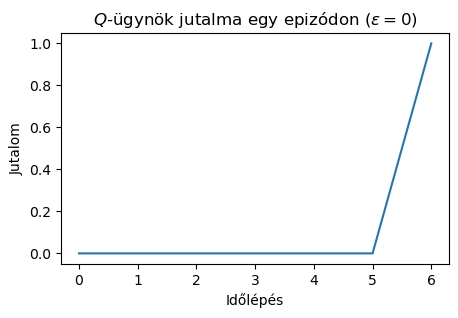

In [36]:
frames = []
rewards = []
done = False
state = env.reset(seed=42)[0]
while not done:
    action = QLAgent(Q=Q, eps=0.0, s=state)
    next_state, reward, done, info, _ = env.step(action)
    rewards.append(reward)
    frames.append(env.render()) 
    state = next_state

plot_rewards(rewards, title=r'$Q$-ügynök jutalma egy epizódon ($\varepsilon = 0$)')

plot_animation(frames)

## Tanulás neurális hálózattal
### Ügynök
#### Neurális hálózat definiálása

In [37]:
class QNetwork(nn.Module):
    def __init__(self, state_size, action_size):  # Architektúra definíció
        super(QNetwork, self).__init__()
        self.fc1 = nn.Linear(state_size, 64)  # Input réteg (teljesen becsatolt)
        self.fc2 = nn.Linear(64, 32)  # Rejtett réteg (teljesen becsatolt)
        self.fc3 = nn.Linear(32, 16)  # Rejtett réteg (teljesen becsatolt)
        self.fc4 = nn.Linear(16, action_size)  # Output réteg (teljesen becsatolt)
        
    def forward(self, state):  # Előrecsatolási csővezeték
        x = self.fc1(state)  # Első rétegen áramoltatás
        x = F.relu(x)  # Első réteg aktivációs függvénye (ReLu)
        x = self.fc2(x)
        x = F.relu(x)
        x = self.fc3(x)
        x = F.relu(x)
        x = self.fc4(x)
        return x

#### Tapasztalat visszajátszás

In [38]:
class ReplayBuffer:
    def __init__(self, buffer_size, batch_size):
        self.batch_size = batch_size
        self.memory = deque(maxlen=buffer_size)
        self.experience = namedtuple("Experience", field_names=["state", "action", "reward", "next_state", "done"])  # Nevesített tömb típus létrehozása
    
    def add(self, state, action, reward, next_state, done):
        e = self.experience(state, action, reward, next_state, done)  # Egy nevesített tömb létrehozása a megkapott paraméterekkel
        self.memory.append(e)
    
    def sample(self):
        experiences = random.sample(self.memory, k=self.batch_size)  # Véletlen minta a memóriából

        # A véletlen minta átalakítása
        states = torch.from_numpy(np.vstack([e.state for e in experiences if e is not None])).float()
        actions = torch.from_numpy(np.vstack([e.action for e in experiences if e is not None])).long()
        rewards = torch.from_numpy(np.vstack([e.reward for e in experiences if e is not None])).float()
        next_states = torch.from_numpy(np.vstack([e.next_state for e in experiences if e is not None])).float()
        dones = torch.from_numpy(np.vstack([e.done for e in experiences if e is not None]).astype(np.uint8)).float()
  
        return states, actions, rewards, next_states, dones

    def __len__(self):  # Ha a __len__ függvény definiálva van le lehet kérdezni a struktúra hosszát a len() függvénnyel
        return len(self.memory)

#### Ügynök

In [39]:
class Agent():
    def __init__(self, alpha, gamma, state_size, action_size, buffer_size, batch_size, update_every):
        # Belső paraméterek
        self.t_step = 0
        self.alpha = alpha  # Tanulási sebesség
        self.gamma = gamma  # Diszkont faktor
        self.batch_size = batch_size  # Kötegméret a tanuláshoz (ekkora mintát fog venni az ügynök a tapasztalat visszajátszásból)
        self.action_size = action_size  # Lehetséges cselekvések száma (ekkora lesz a Q-hálózat output rétege)
        self.buffer_size = buffer_size  # Buffer méret (összesen ennyi rekord lesz a tapasztalat memóriában)
        self.update_every = update_every  # Ennyi tanítási iterációnként fog történni egy tanítási lépés
        # Hálózat és belső memória
        self.qnetwork = QNetwork(state_size, action_size)  # Q-hálózat
        self.optimizer = optim.Adam(self.qnetwork.parameters(), lr=alpha)  # Optimalizáló algoritmus
        self.memory = ReplayBuffer(buffer_size, batch_size)  # Tapasztalat memória
        self.network_name = 'FrozenLake_DQN.pth'  # Fájlnév a modell fájlhoz
        # Követési struktúrák
        self.mse_track = []  # MSE hiba követése
        self.action_stack = np.zeros((0, 2))  # Cselekvések követése
        self.state_action_stack = np.zeros((0, action_size))  # Állapotok követése

    def step(self, state, action, reward, next_state, done):
        self.memory.add(state, action, reward, next_state, done)  # A tapasztalat hozzáadása a tapasztalati memóriához
        self.action_stack = np.vstack([self.action_stack, np.array([action, reward])])
        self.t_step = (self.t_step + 1) % self.update_every  # Ha elér 0-hoz akkor tanítási ciklus fog történni

        if self.t_step == 0 and len(self.memory) > self.batch_size:  # Ha az ügynök elért egy tanítási iterációt és van elég összegyűlt tapasztalat
            experiences = self.memory.sample()  # A tapasztalat memória véletlen mintázása
            self.learn(experiences)  # Tanulás a tapasztalattal

    def act(self, state, eps):  # Cselekvés választása az állapot alapján
        state = torch.from_numpy(state).float().unsqueeze(0)
        self.qnetwork.eval()  # Hálózát átállítása kiértékelési módba
        with torch.no_grad():  # Predikció végrehajtása
            action_values = self.qnetwork(state)  # Predikció a neurális hálózattal
        self.qnetwork.train()  # Hálózat tanító módba állítása

        self.state_action_stack = np.vstack([self.state_action_stack, np.array(action_values)])  # Követési struktúrához hozzáfűzés

        p = np.random.random()
        if p < eps:  # Epszilon-mohó cselekvés választás
            return random.choice(np.arange(self.action_size))  # Véletlen cselekvés
        else:
            return np.argmax(action_values.cpu().data.numpy())  # Legjobb cselekvés az aktuális állapotból

    def learn(self, experiences):  # Ügynök tanulásának eljárása
        states, actions, rewards, next_states, dones = experiences  # Véletlen miniköteg kicsomagolása

        # Költség kiszámítása
        q_targets_next = self.qnetwork(next_states).detach().max(1)[0].unsqueeze(1)  # Q-értékek a következő állapotban
        q_targets = rewards + self.gamma * q_targets_next * (1 - dones)  # Q célértékek számítása
        q_expected = self.qnetwork(states).gather(1, actions)  # Q-értékek az aktuális állapotban
        
        # Költség számítása
        loss = F.mse_loss(q_expected, q_targets)  # Hiba kiszámítása (Ebben az esetben az átlagos négyzetes eltérés)
        self.mse_track.append(loss)  # Hiba hozzáadása a hiba követési struktúrájához
        self.optimizer.zero_grad()  # Gradiensek hozzájárulásának törlése a kötegelt költség számítása előtt
        loss.backward()  # Hiba visszaáramoltatása a hálózatba
        self.optimizer.step()  # Lépés végrehajtása az optimalizációs algoritmussal

    def save_network(self):
        torch.save(self.qnetwork.state_dict(), self.network_name) 
    
    def load_network(self):
        self.qnetwork.load_state_dict(self.network_name)

### Paraméterek

In [40]:
max_t = 100  # Maximális időlépés egyetlen epizódon belül
max_i = 30000  # Epizódok száma
gamma = 0.98  # Diszkontálási faktor
alpha = 5e-4  # Tanulási sebesség 
eps_end = 0.0  # Felfedezési ráta kezdőértéke
eps_start = 1.0  # Felfedezési ráta végértéke
eps_decay = 0.9999  # Felfedezési ráta iterációnként ennyivel fog csökkenni
batch_size = 64  # Kötegméret - tapasztalat visszajátszásból vett minta mérete
update_every = 4  # Milyen gyakran frissüljön a hálózat
window_size = 50  # Jutalmak átlagolási ablakának mérete 
buffer_size = 100000  # Tapasztalat visszajátszás maximális mérete
success_thresh = .9  # Sikeresnek mondható a tanítás ha efölé az érték főlé emelkedik az ablakos jutalom

eps = eps_start  # Felfedezési ráta inicializálása
rewards = []  # Jutalmak követési struktúrája

env = gym.make(id = 'FrozenLake-v1', 
               desc = None, 
               map_name = "4x4", 
               is_slippery = True, 
               render_mode = 'rgb_array')  # Környezet

state_size = env.observation_space.n
action_size = env.action_space.n

agent = Agent(alpha = alpha, 
              gamma = gamma, 
              state_size = state_size, 
              action_size = action_size,
              buffer_size = buffer_size,
              batch_size = batch_size,
              update_every = update_every)  # Ügynök inicializálása

# Állapot 1-hot kódolása (erre a diszkrét állapotok miatt van szükség - folytonos állapotok esetén nem szükséges)
def encode_state(s, n_obs):
    result = np.zeros(n_obs)
    result[s] = 1
    return result

### Tanítás futtatása

In [41]:
for i in range(max_i):
    state = encode_state(env.reset()[0], state_size)
    done = False
    r_sum = 0

    for t in range(max_t):
        action = agent.act(state, eps)
        next_state, reward, done, info, _ = env.step(action)
        next_state = encode_state([next_state], state_size)
        agent.step(state, action, reward, next_state, done)
        r_sum += reward
        state = next_state
        if done:
            break

    rewards.append(r_sum)
    r_mean = round(np.mean(rewards[max(0, len(rewards) - window_size) : len(rewards) - 1]), 2)
    eps = eps * eps_decay if eps > eps_end else eps_end

    if i % 1000 == 0:
        print(f'Epizód: {(str(i) + ",").ljust(10)} Átlagos jutalom: {r_mean}')
    
    if r_mean > success_thresh: 
        print(f'Környezet sikeresen megoldva {i} iteráció alatt')
        print(f'Átlagos jutalom: {r_mean}')
        agent.save_network()
        print(f'Hálózat állapota elmentve')
        break

Epizód: 0,         Átlagos jutalom: nan
Epizód: 1000,      Átlagos jutalom: 0.0
Epizód: 2000,      Átlagos jutalom: 0.0
Epizód: 3000,      Átlagos jutalom: 0.0
Epizód: 4000,      Átlagos jutalom: 0.08
Epizód: 5000,      Átlagos jutalom: 0.1
Epizód: 6000,      Átlagos jutalom: 0.1
Epizód: 7000,      Átlagos jutalom: 0.0
Epizód: 8000,      Átlagos jutalom: 0.12
Epizód: 9000,      Átlagos jutalom: 0.08
Epizód: 10000,     Átlagos jutalom: 0.12
Epizód: 11000,     Átlagos jutalom: 0.14
Epizód: 12000,     Átlagos jutalom: 0.12
Epizód: 13000,     Átlagos jutalom: 0.33
Epizód: 14000,     Átlagos jutalom: 0.22
Epizód: 15000,     Átlagos jutalom: 0.29
Epizód: 16000,     Átlagos jutalom: 0.22
Epizód: 17000,     Átlagos jutalom: 0.24
Epizód: 18000,     Átlagos jutalom: 0.22
Epizód: 19000,     Átlagos jutalom: 0.2
Epizód: 20000,     Átlagos jutalom: 0.24
Epizód: 21000,     Átlagos jutalom: 0.27
Epizód: 22000,     Átlagos jutalom: 0.35
Epizód: 23000,     Átlagos jutalom: 0.39
Epizód: 24000,     Átlag

### Jutalmak ábrázolása

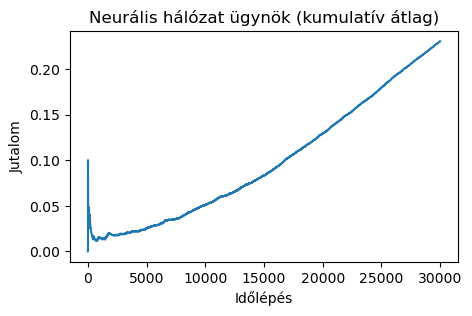

In [42]:
plot_rewards(rewards, rolling=True, title='Neurális hálózat ügynök (kumulatív átlag)')

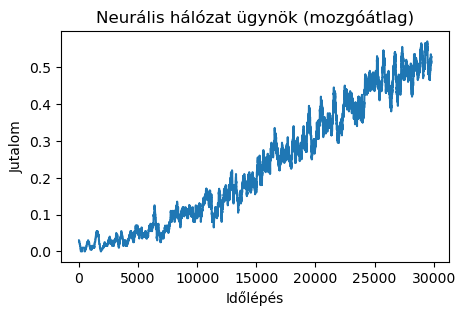

In [43]:
plot_rewards(rewards, window_size=200, title='Neurális hálózat ügynök (mozgóátlag)')

### Epizód lejátszása az ügynökkel

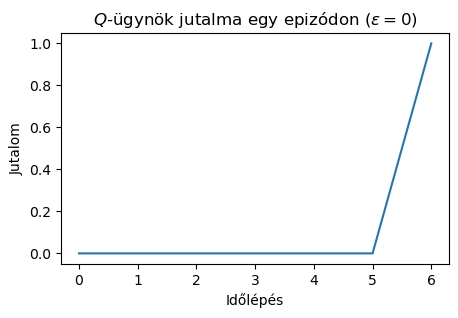

In [44]:
frames = []
rewards = []
done = False
state = encode_state(env.reset(seed=42)[0], state_size)
while not done:
    action = agent.act(state, eps=0.0)
    next_state, reward, done, info, _ = env.step(action)
    next_state = encode_state(next_state, state_size)
    frames.append(env.render()) 
    rewards.append(reward)
    state = next_state

plot_rewards(rewards, title=r'$Q$-ügynök jutalma egy epizódon ($\varepsilon = 0$)')

plot_animation(frames)